Library Requirement:

```python
 numpy, pandas, ase, dpdata, matplotlib, sparc, nglview
```

Required Files:
```bash
- input.yaml    (workflow input file)
- input.json    (Deepmd training file)
- INCAR         (VASP input file)
- POSCAR        (Strcuture file in VASP/POSCAR)
```

In [1]:
import os
import numpy as np
import pandas as pd
#
from ase.io import read, write
import dpdata
from ase import Atoms
from ase.io import read, write
from matplotlib import pyplot as plt
#
import lammps_logfile as lmp_log
from sparc.src.utils.plot_utils import *

### [1] Workflow Analysis

We can Utilize the `ViewTraj` function to visualize the sample trajectory accumulated over different iterations stored in ``TrajCombined.traj`` file

In [2]:
traj = read('TrajCombined.traj', index=':')
print(f"Total Frames in Trajectory {len(traj)}")

Total Frames in Trajectory 3236


In [71]:
# Import local function to visualize trajectory
from sparc.src.utils.plot_utils import ViewTraj
ViewTraj(traj)

NGLWidget(max_frame=3235)

#### [11] Plot error in `Forces` over the course of iteration workflow

Shaded region in the plot is just to show that these candidates are chosen for labelling. 
By-default its range is set between `0.05 - 0.5 eV/Ang.`. Based on the `min_devi` and `max_devi` in the `input.yaml` file this can be changed to user defined value with the keyword `dmin` and `dmax`.

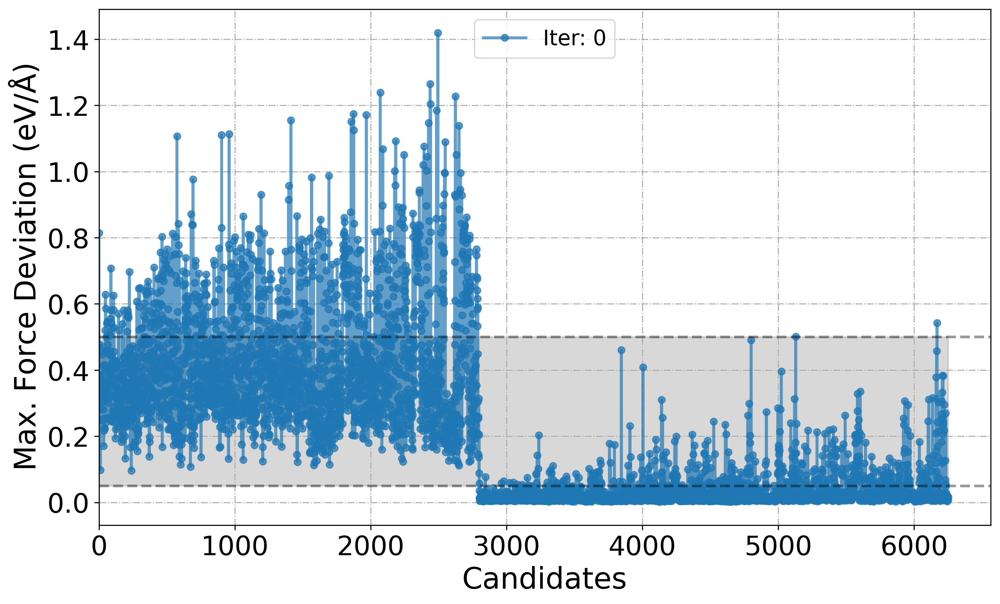

In [7]:
# Import local function to plot model deviation
from sparc.src.utils.plot_utils import PlotForceDeviation

# We can choose a specific Iter_xxx folder or all to plot deviation in forces
PlotForceDeviation(root_dir='./', target_iteration=0)

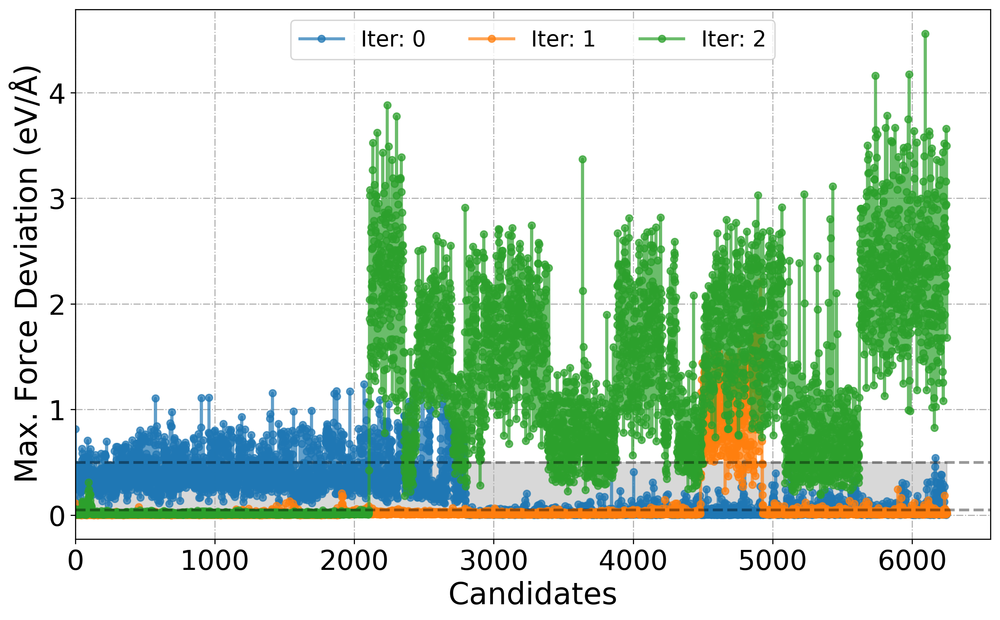

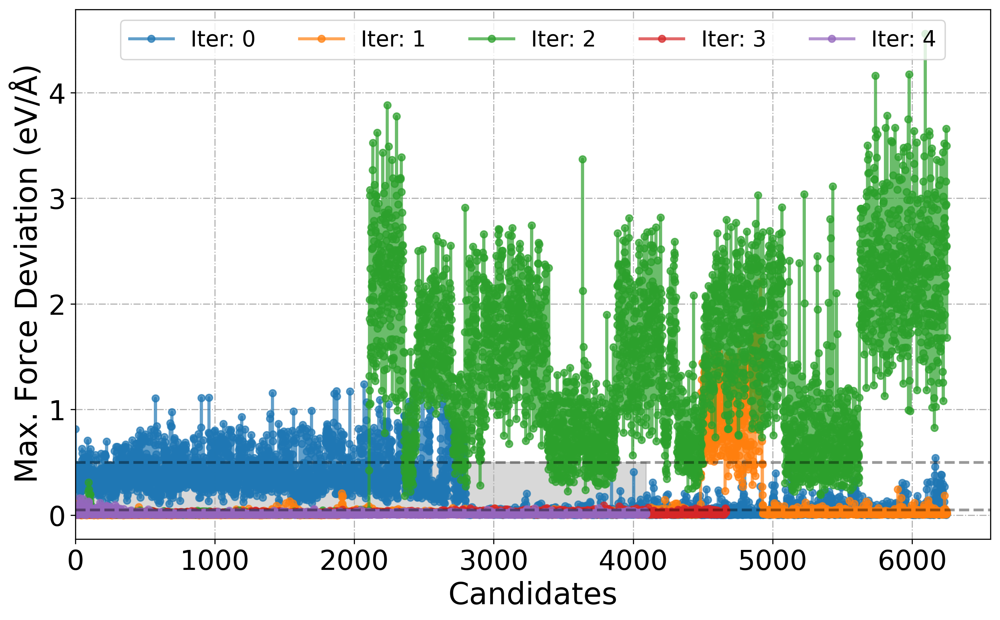

In [9]:
# We can also choose a range of Iter_xxx folder
PlotForceDeviation(root_dir='./', iteration_window=(0,2))

# or all
PlotForceDeviation(root_dir='./', iteration_window='all')

In [120]:
# print(plt.style.available)

In [6]:
help(PlotForceDeviation)

Help on function PlotForceDeviation in module sparc.src.utils.plot_utils:

PlotForceDeviation(root_dir='.', iteration_window='all', target_iteration=None, dmin=0.05, dmax=0.5)
    Parses model_dev_*.out files from iter_* directories (or a specific range/iteration/all),
    extracts max force deviation, and plots the results.
    
    Parameters:
        root_dir (str): Root directory containing iter_* folders.
        iteration_window (tuple or str): A tuple (start, end) to specify a range of iterations, or "all" to process all iterations.
        target_iteration (int): A specific iteration number to analyze.
        dmin (float): Lower threshold for candidate force deviation (default: 0.05).
        dmax (float): Upper threshold for candidate force deviation (default: 0.5).
        
    Example:
        >>> PlotForceDeviation("/path/to/root", iteration_window=(2, 5))
        >>> PlotForceDeviation("/path/to/root", target_iteration=3)
        >>> PlotForceDeviation("/path/to/root", it

#### [12] Learning Curve
The default training loss output file generated by DeePMD-kit is `lcurve.out`. This file contains the evolution of various loss components during training, including energy, force, virial, and total loss for both the training and validation datasets. We can plot this with `PlotLcurve` function.

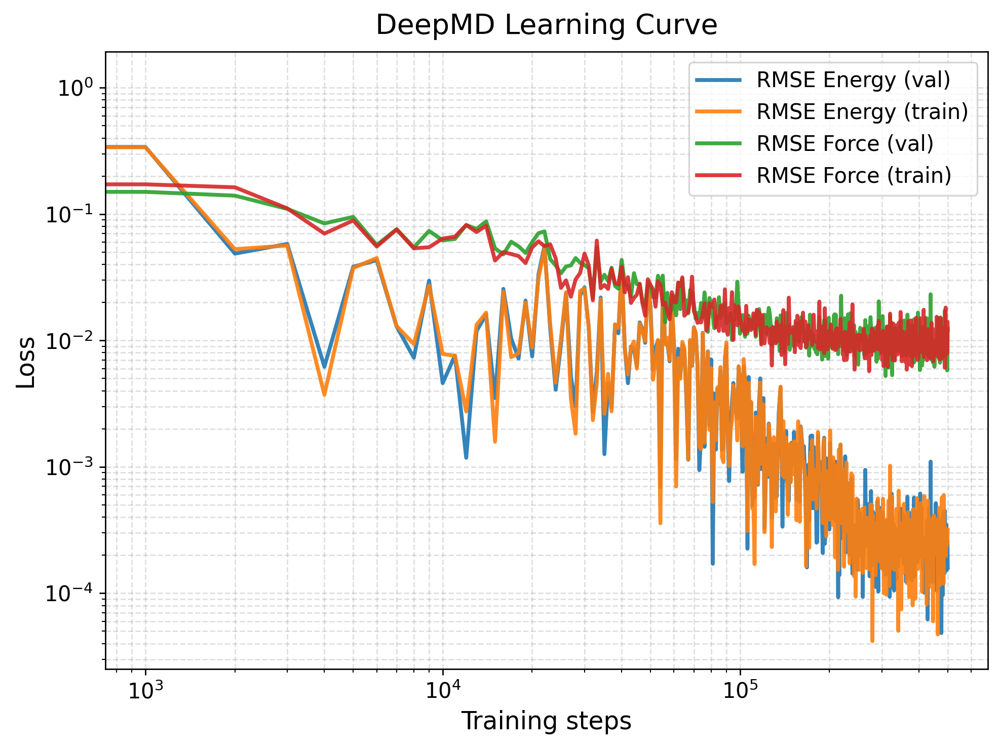

In [ ]:
from sparc.src.utils.plot_utils import PlotLcurve
# If provided keyword 'save_fig', save the figure (e.g., "save_fig=lcurve.png").
PlotLcurve(lcurve_file='iter_000000/01.train/training_1/lcurve.out')

#### [13] Parity Plot
We wrote a customized `ParityPlot` function, which can do parity plot for energies and force components on a test/validation data provided by the user.

- (A) Energy
- (B,C,D) XYZ-component of forces

2025-05-14 13:02:28.183860: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9482 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3080 Ti, pci bus id: 0000:55:00.0, compute capability: 8.6
2025-05-14 13:02:28.183960: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 10229 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3080 Ti, pci bus id: 0000:a2:00.0, compute capability: 8.6


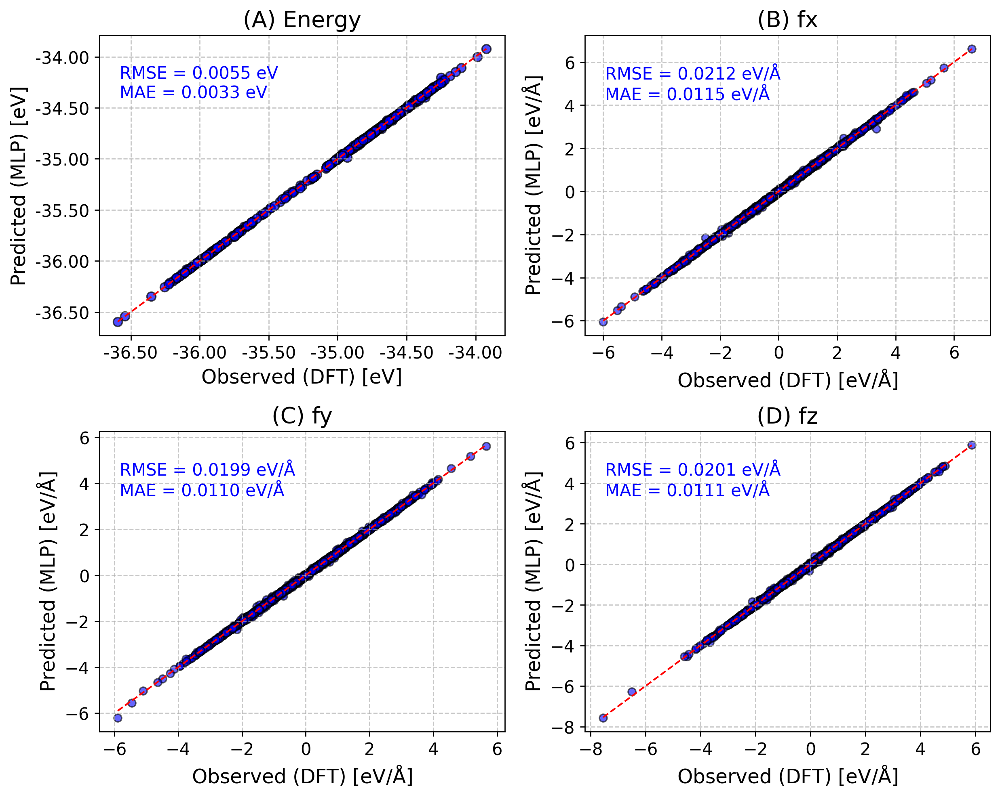

In [14]:
from sparc.src.utils.plot_utils import ParityPlot
#
!export KMP_WARNINGS=0
ParityPlot(data_dir='DeePMD_training/00.data/validation_data',
          model_path='iter_000004/01.train/training_1/frozen_model_1.pb',
          type='all')

One can also do per_atom energy/forces with `per_atom=True`.

Also If provided keyword `save_fig`, save the figure (e.g., "save_fig=parity.png").

2025-05-14 13:06:11.844494: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9482 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3080 Ti, pci bus id: 0000:55:00.0, compute capability: 8.6
2025-05-14 13:06:11.844600: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 10229 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3080 Ti, pci bus id: 0000:a2:00.0, compute capability: 8.6


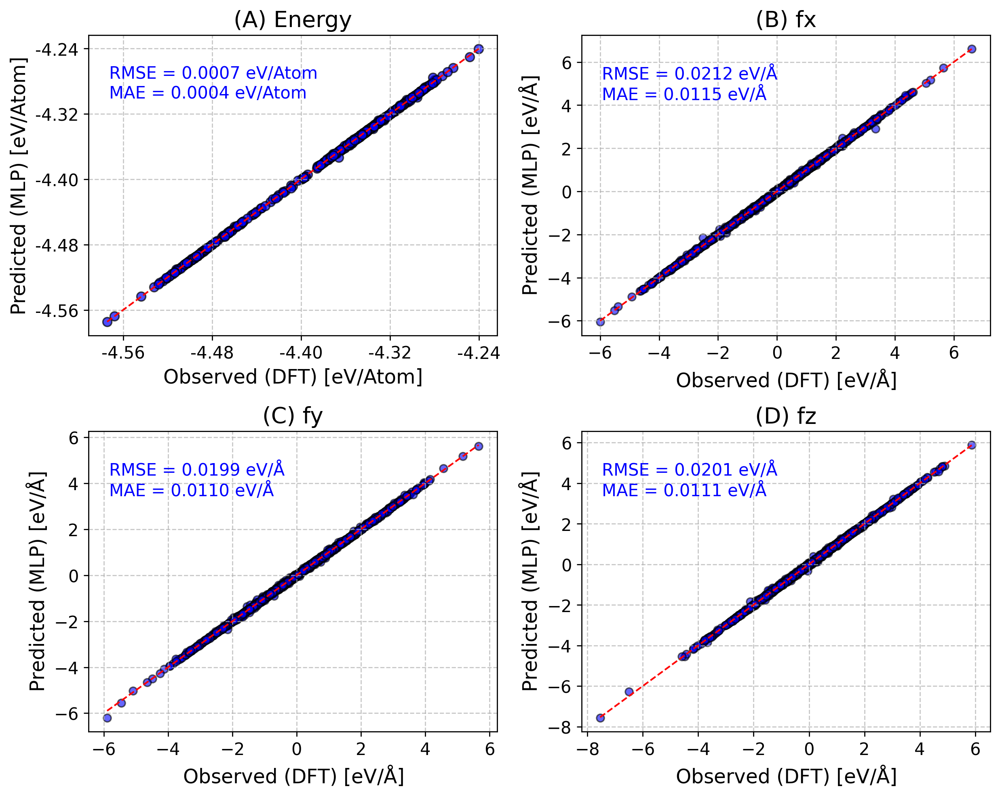

In [17]:
from sparc.src.utils.plot_utils import ParityPlot
#
!export KMP_WARNINGS=0
ParityPlot(data_dir='DeePMD_training/00.data/validation_data',
          model_path='iter_000004/01.train/training_1/frozen_model_1.pb',
          per_atom=True,
          type='all')

#### [14] Labelled Candidates Energies Across Active Learning Iterations

In active learning workflows, labeled candidates refer to configurations selected for high-fidelity labeling (e.g., via DFT) during each iteration of model refinement. Plotting the potential energies of these labeled structures as a function of iteration will provide the insights into model exploration.

Similar to `PlotForceDeviation` function we can choose a specific `Iter_xxx` folder or all to plot energies.


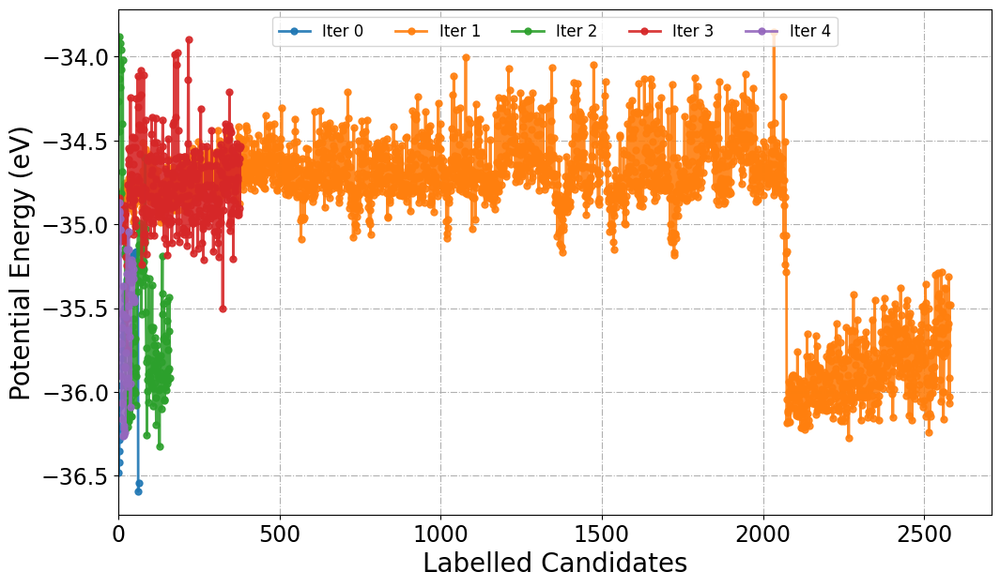

In [20]:
from sparc.src.utils.plot_utils import PlotPotentialEnergy 
#
PlotPotentialEnergy(root_dir='./', traj_filename='AseMD.traj', iteration_window='all')

#### [15] Potential Energy

Plotting the potential energy as a function of a selected interatomic distance provides a perspective on the structural and energetic evolution of the dataset. This help us find how configurations sampled during active learning are distributed across different regions of the potential energy surface. The relationship between energy and bond length (or other distance-based descriptors), one can assess the diversity of the data, detect the presence of unphysical or high-energy structures, and monitor whether new configurations expand the training set into previously unexplored areas.

We have written a function `PlotPES` funtion which generates two-dimensional plots of energy versus bond distance using histogram, kernel density estimation (KDE), or hexbin representations.

Parsing iterations:
  Iter  0: 64 frames
  Iter  1: 2581 frames
  Iter  2: 161 frames
  Iter  3: 379 frames
  Iter  4: 51 frames

Total frames: 3236


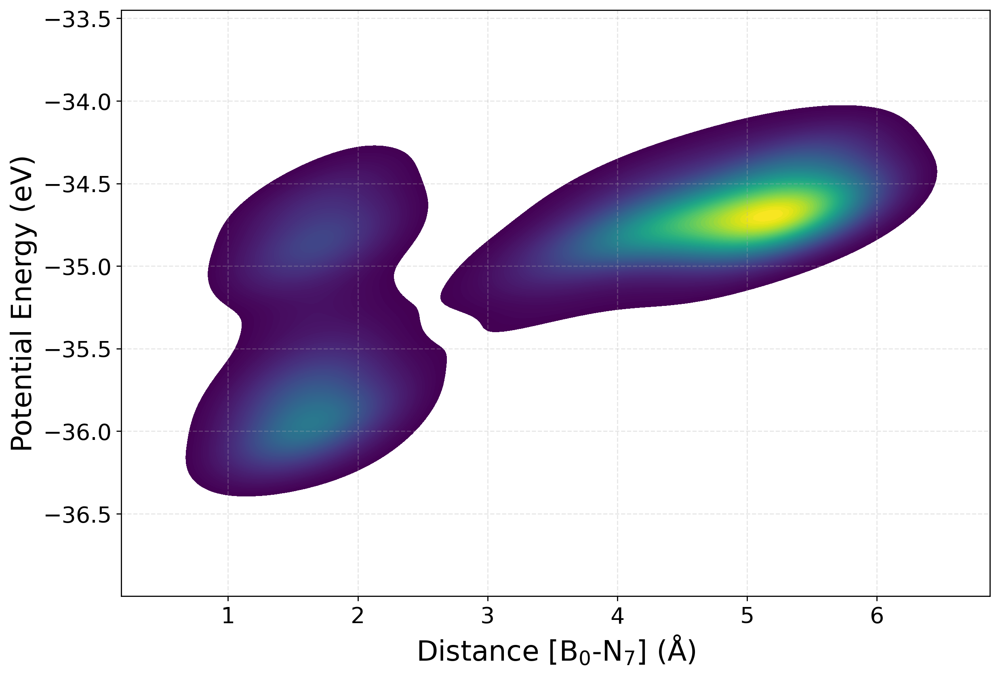

In [41]:
from sparc.src.utils.plot_utils import PlotPES

PlotPES(root_dir='.', iteration_window='all', traj_filename='AseMD.traj', 
        distance_pair=(0, 7), type='kde')

Parsing iterations:
  Iter  1: 2581 frames

Total frames: 2581


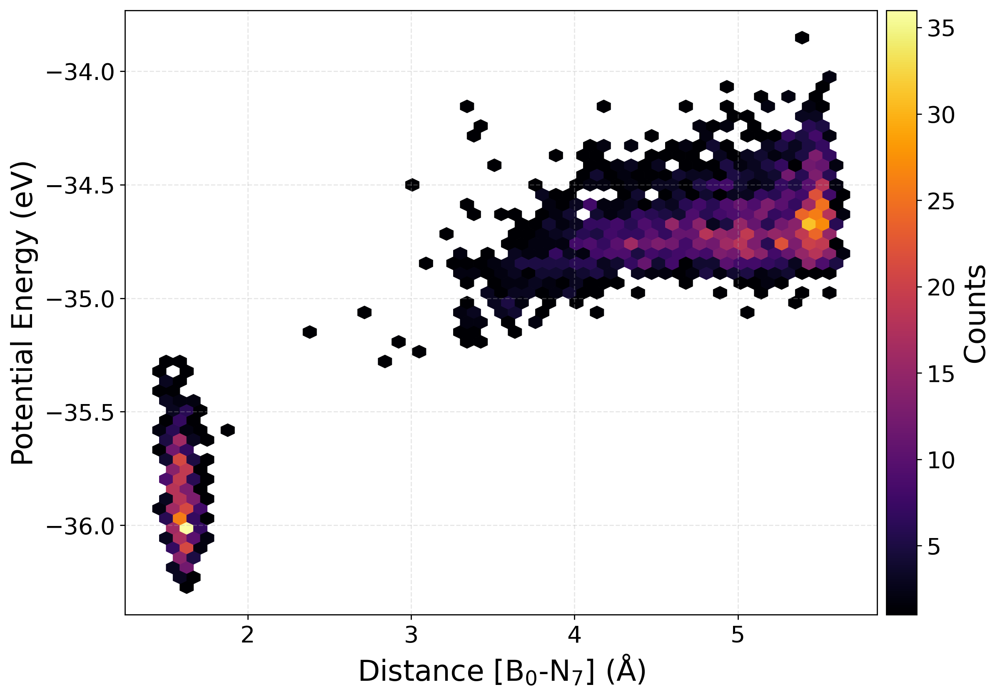

In [32]:
PlotPES(root_dir='.', target_iteration=1, traj_filename='AseMD.traj', distance_pair=(0, 7), type='hexbin')

Parsing iterations:
  Iter  1: 2581 frames

Total frames: 2581


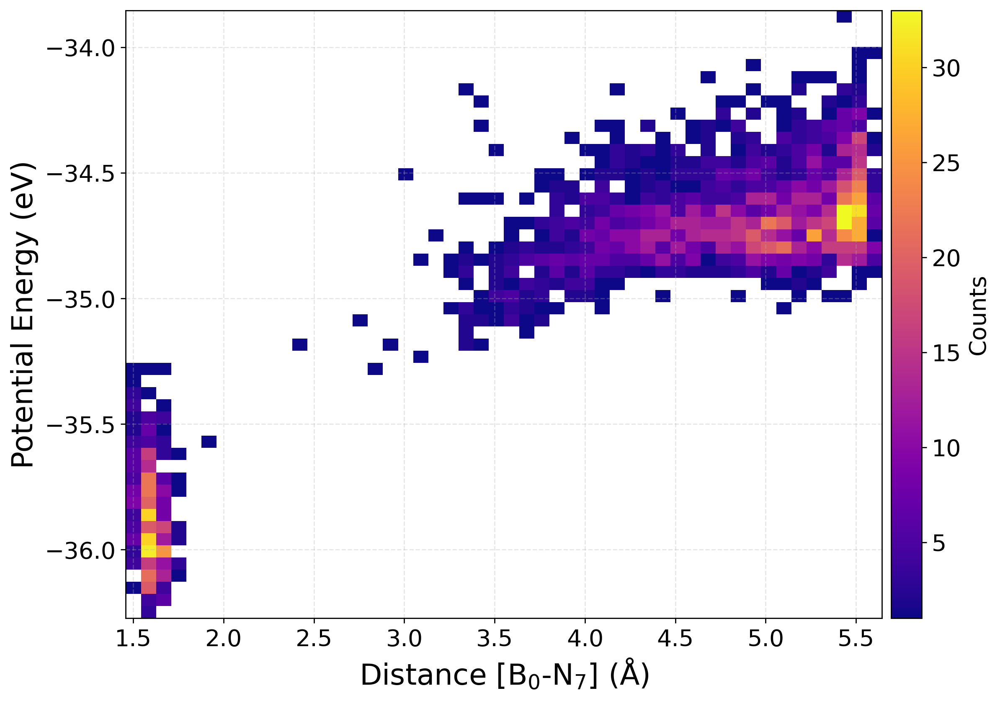

In [36]:
PlotPES(root_dir='.', target_iteration=1, traj_filename='AseMD.traj', distance_pair=(0, 7), type='heatmap')

#### [16] Plot Property Distribution

The `PlotDistribution` function tool visualize the statistical distribution of potential energies or bond distances extracted from atomic trajectories generated during active learning iteration. We can monitor the diversity in sampling, convergence, and structural variation in the training set.

When `get="energy"`, the function extracts potential energy values from ASE trajectories using `get_potential_energy()`. This is useful for identifying fluctuations in sampled configurations, detecting outliers, and observing energetic stabilization across iterations. When `get="distance:i,j"` is specified, the function computes the bond distance between atoms i and j using function `get_distance(i, j)`, enabling geometric analysis of specific interatomic interactions.

Similar to `PlotForceDeviation` function we can choose a specific Iter_xxx folder or all to plot energies.

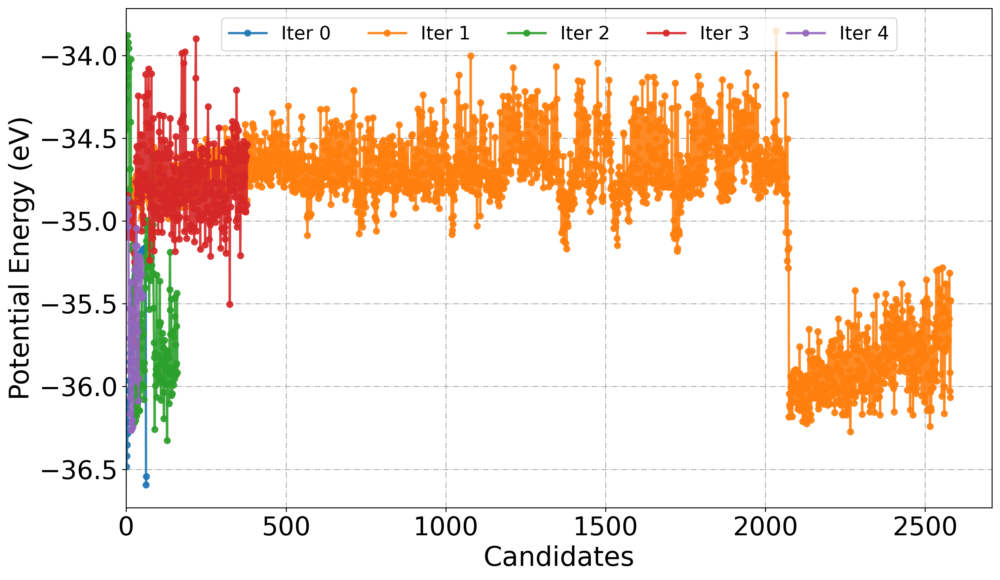

In [ ]:
from sparc.src.utils.plot_utils import PlotDistribution
# Plot Potential energy as linePlot from each iteration
PlotDistribution(root_dir='./', get='energy', iteration_window='all', traj_filename='AseMD.traj', type='line')

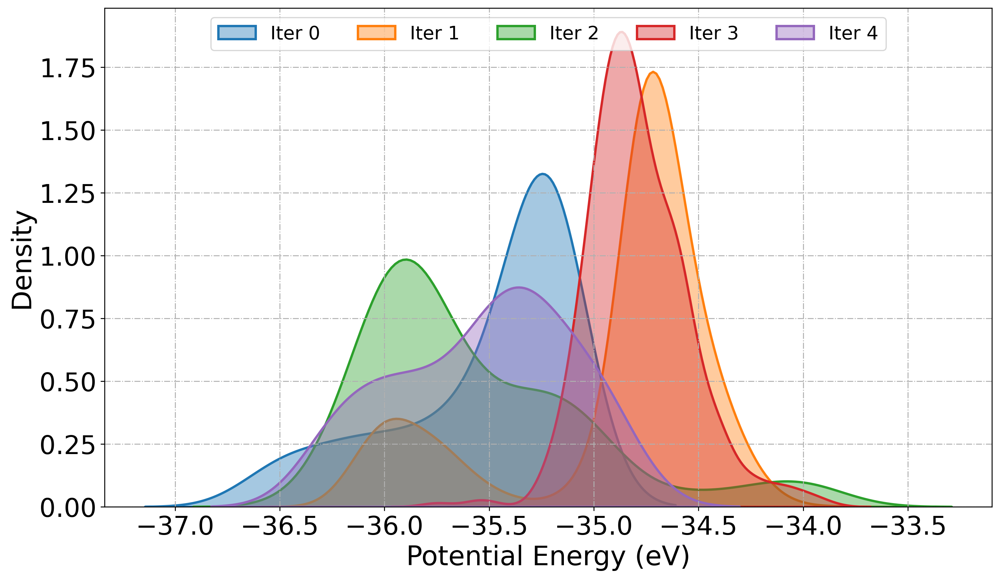

In [ ]:
# Plot KDE of Potential energy
PlotDistribution(root_dir='./', get='energy', iteration_window='all', traj_filename='AseMD.traj', type='kde')

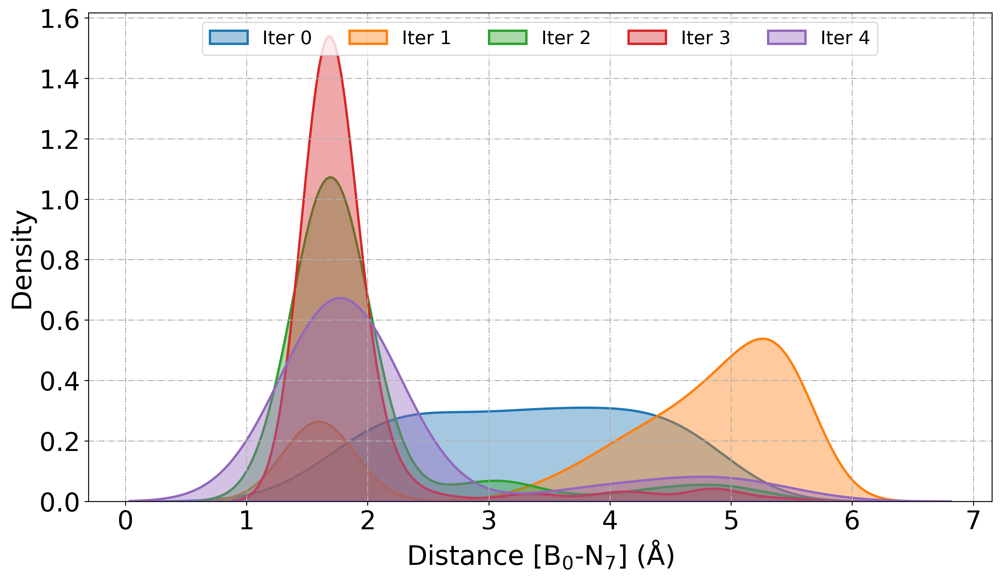

In [ ]:
# Plot KDE of distance between atom 0 (Boron) and atom 7 (Nitrogen)
PlotDistribution(root_dir='./', get='distance:0,7', iteration_window='all', traj_filename='AseMD.traj', type='kde')

#### [17] Plot ML/MD Temperature

The `PlotTemp` function is designed to extract and visualize the temperature evolution from ML/MD trajectories generated during active learning. It scans trajectory files (e.g., dpmd.traj) located within `Iter_xxx/02.dpmd` directories and plots the instantaneous temperature across simulation frames.

Mean Temperature (K) from Iteration 0 := 347.90
Mean Temperature (K) from Iteration 1 := 349.93
Mean Temperature (K) from Iteration 2 := 348.82
Mean Temperature (K) from Iteration 3 := 349.94
Mean Temperature (K) from Iteration 4 := 349.62


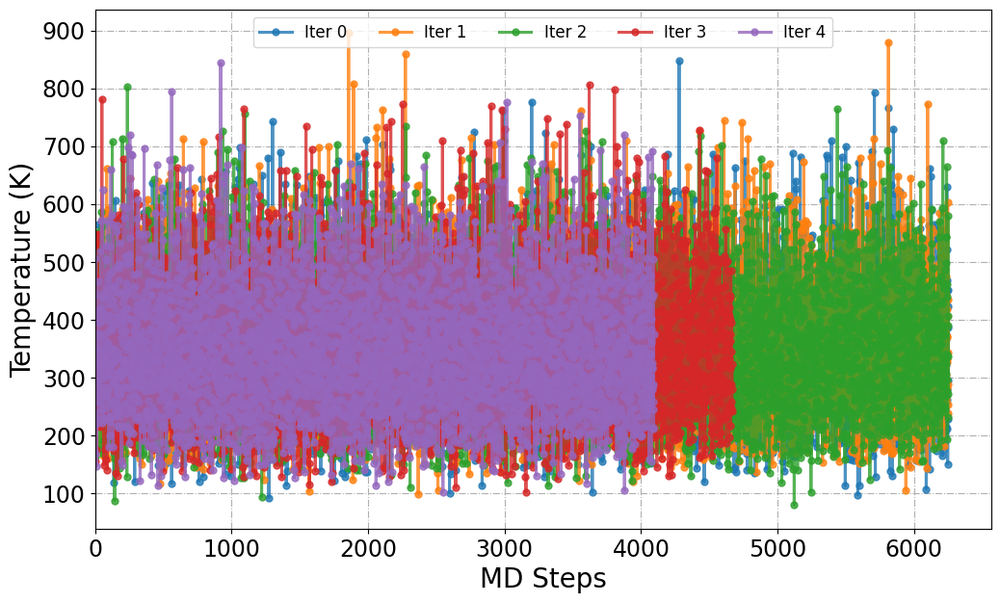

In [51]:
from sparc.src.utils.plot_utils import PlotTemp
# 
PlotTemp(root_dir=".", iteration_window='all', traj_filename="dpmd.traj")

#### [18] Read COLVAR files (Plumed)

In [4]:
from sparc.src.utils.plot_utils import ReadColvar
#
root_dir='./'
colvar_data = {}
for folder in sorted(os.listdir(root_dir)):
    if folder.startswith("iter_"):
        colvar_path = os.path.join(root_dir, folder, "02.dpmd", "COLVAR")
        if os.path.exists(colvar_path):
            print(f"Reading: {colvar_path}")
            data = ReadColvar(colvar_path)
            colvar_data[folder] = data
        else:
            print(f"Missing COLVAR file in {folder}")

Reading: ./iter_000000/02.dpmd/COLVAR
Reading: ./iter_000001/02.dpmd/COLVAR
Reading: ./iter_000002/02.dpmd/COLVAR
Reading: ./iter_000003/02.dpmd/COLVAR
Reading: ./iter_000004/02.dpmd/COLVAR


In [58]:
colvar_data.keys()

dict_keys(['iter_000000', 'iter_000001', 'iter_000002', 'iter_000003', 'iter_000004'])

In [62]:
colvar_data['iter_000000'].head()

,time,d1,ss.coord-0,ss.coord-1,ss.coord-2,ss.coord-3,ss.coord-4,ss.coord-5,ss.coord-6,ss.coord-7,pb.bias
0,0.000,0.492411,1.694711,3.803112,3.848012,4.213217,4.487124,4.994629,5.061090,2.643729,0.0
1,0.003,0.492650,1.685249,3.800578,3.851308,4.206756,4.476842,4.993015,5.057702,2.620900,0.0
2,0.006,0.492884,1.678498,3.799042,3.855629,4.198999,4.466045,4.991398,5.054066,2.596992,0.0
3,0.009,0.493111,1.674489,3.798344,3.860757,4.190269,4.455041,4.989711,5.050308,2.572967,0.0
4,0.012,0.493330,1.673221,3.798316,3.866467,4.180893,4.444124,4.987890,5.046550,2.549786,0.0


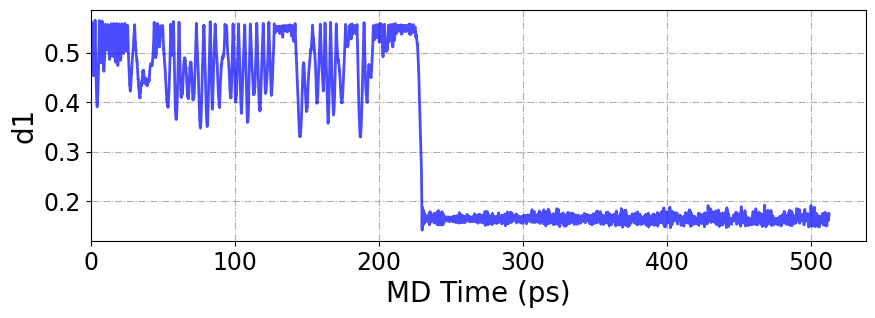

In [74]:
plt.figure(figsize=(10, 3))
plt.plot(colvar_data['iter_000000']['time'], colvar_data['iter_000000']['d1'], lw=2, color='b', alpha=0.7)

plt.xlabel("MD Time (ps)", fontsize=20)
plt.ylabel("d1", fontsize=20)
plt.xlim(0, None)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.grid(ls='-.')
plt.show()

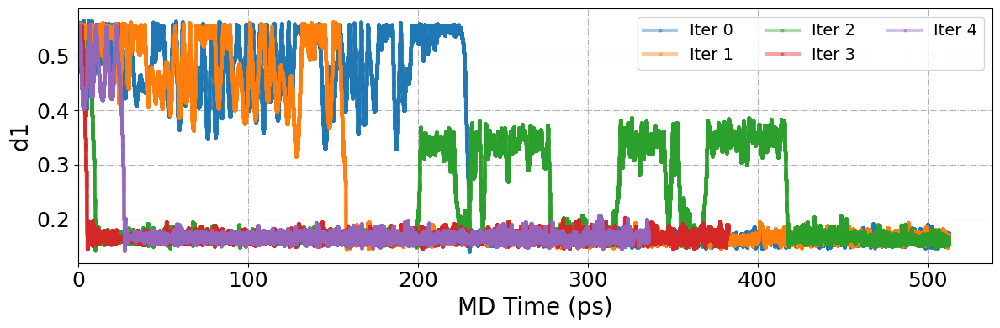

In [97]:
plt.figure(figsize=(12, 4))
#
sorted_keys = sorted(colvar_data.keys())

for idx, iter_name in enumerate(sorted_keys):
    data = colvar_data[iter_name]
    if 'd1' in data and 'time' in data:
        plt.plot(data['time'], data['d1'], linestyle="-", lw=3, alpha=0.4, marker='o', ms=2, label=f"Iter {idx}")

plt.xlabel("MD Time (ps)", fontsize=20)
plt.ylabel("d1", fontsize=20)
plt.xlim(0, None)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(ls='-.')
plt.legend(fontsize=14, loc='upper right', ncol=3)
plt.tight_layout()
plt.show()

We can also plot the `SPRINT` coordintes and the bias added during the MD simulation.

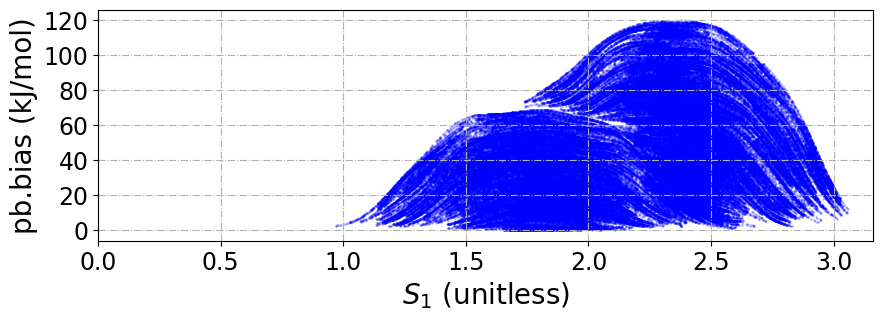

In [197]:
plt.figure(figsize=(10, 3))
plt.scatter(colvar_data['iter_000000']['ss.coord-0'], colvar_data['iter_000000']['pb.bias'], s=1, color='b', alpha=0.2)

plt.xlabel(r"$S_1$ (unitless)", fontsize=20)
plt.ylabel("pb.bias (kJ/mol)", fontsize=20)
plt.xlim(0, None)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.grid(ls='-.')
plt.show()

#### [19] Energy Evaluation and Model Comparison

We provide an `analysis` utility designed to compute the potential energy of a given atomic configuration using each model over different iteration. This enables direct comparison between the predicted energies from machine learning potentials and the corresponding ground-truth values obtained from high-fidelity reference calculations (e.g., DFT).

This can be executed directly from the terminal using the --analysis flag:
```bash
sparc --analysis get_energies --dft_file OUTCAR.scan --bond 0 7 --out energies.csv
```

In [123]:
data = pd.read_csv('energies.csv', sep='\s+')
data.head()

,Dist.,E(DFT),E(iter_000000),E(iter_000001),E(iter_000002),E(iter_000003),E(iter_000004)
0,1.406,-36.094409,-36.094066,-36.094683,-36.094350,-36.089606,-36.092639
1,1.456,-36.343395,-36.344538,-36.345687,-36.345053,-36.341639,-36.343399
2,1.506,-36.505706,-36.507677,-36.509061,-36.507523,-36.505988,-36.506751
3,1.557,-36.602935,-36.605246,-36.605750,-36.604283,-36.602956,-36.604020
4,1.606,-36.647457,-36.649711,-36.649056,-36.647673,-36.646569,-36.648659


We can plot this data and compare the deviation from the ground-truth energy, as shown in the inset plot.

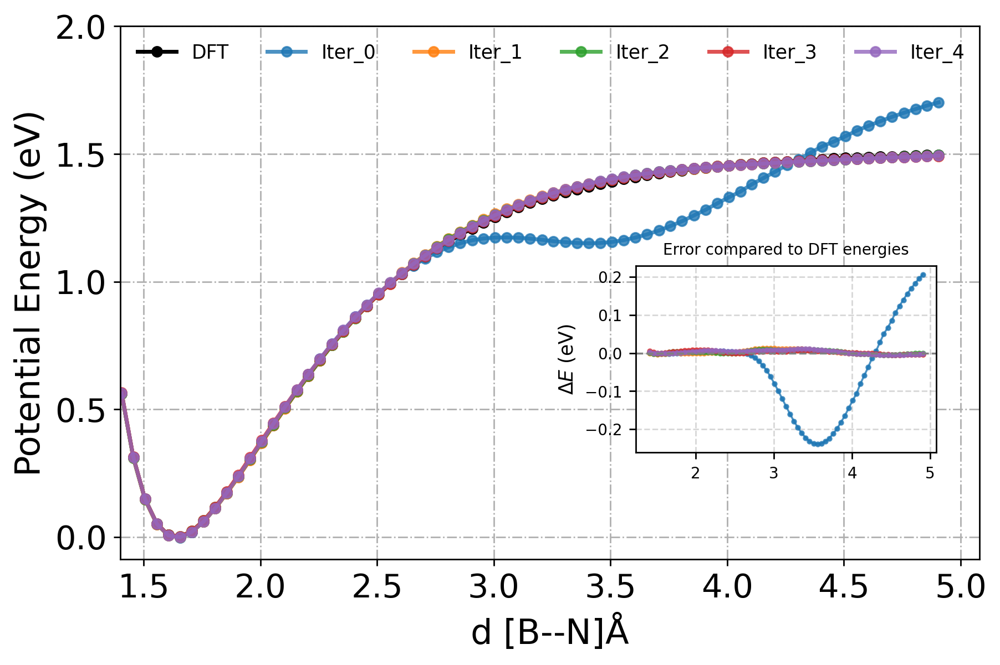

In [29]:
fig, ax1 = plt.subplots(figsize=(8, 5), dpi=250)

# Get DFT energy reference
dist = data['Dist.']
energy = data['E(DFT)']
Emin = min(data['E(DFT)'])

# Plot DFT energy curve
ax1.plot(dist, (np.array(energy) - Emin), label='DFT', c='black', lw=2, marker='o', ms=5)

# Plot DeePMD energy curves
for i in range(0,5):
    iter_name = f"iter_00000{i}"
    plt.plot(dist, (data[f'E({iter_name})'] - Emin), label=f'Iter_{i}',lw=2, marker='o', ms=5, alpha=0.8)

# Inset subplot for energy difference (DeePMD - DFT)
ax_inset = ax1.inset_axes([0.6, 0.20, 0.35, 0.35])  # Moved y from 0.1 → 0.25

for i in range(0,5):
    iter_name = f"iter_00000{i}"
    diff = np.array(data[f'E({iter_name})']) - np.array(energy) # Compute energy difference
    ax_inset.plot(dist, diff, lw=1, marker='o', ms=2, alpha=0.8)

# Formatting the inset
ax_inset.axhline(y=0, color='gray', linestyle='--', lw=1)  # Add a reference line at y=0
# ax_inset.set_xlabel(r"d [B--N]$\rm{\AA}$", fontsize=10)
ax_inset.set_ylabel(r"$\Delta E$ (eV)", fontsize=10)
ax_inset.tick_params(axis='both', labelsize=8)
ax_inset.set_title("Error compared to DFT energies", fontsize=8)

ax_inset.grid(ls='--', alpha=0.5)

# Main plot labels and legend
ax1.set_xlabel(r"d [B--N]$\rm{\AA}$", fontsize=18, color='black')
ax1.set_ylabel("Potential Energy (eV)", fontsize=18, color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Set multi-column legend with 4 columns for the main plot
ax1.legend(loc="upper left", fontsize=10, ncol=6, frameon=False)

ax1.tick_params(axis='both', labelsize=17)

# Additional plot settings
plt.xlim(1.4, None)
plt.ylim(None, 2.0)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.grid(ls='-.')

plt.show()

Since the model in premeture in the beginning, as we only started with `64` initial configuration. The error in energy prediction is high for the first iteration. To better assess the model’s learning behavior, we will plot Error relative to the ground truth (DFT) as heatmap, rather than the absolute energy values.

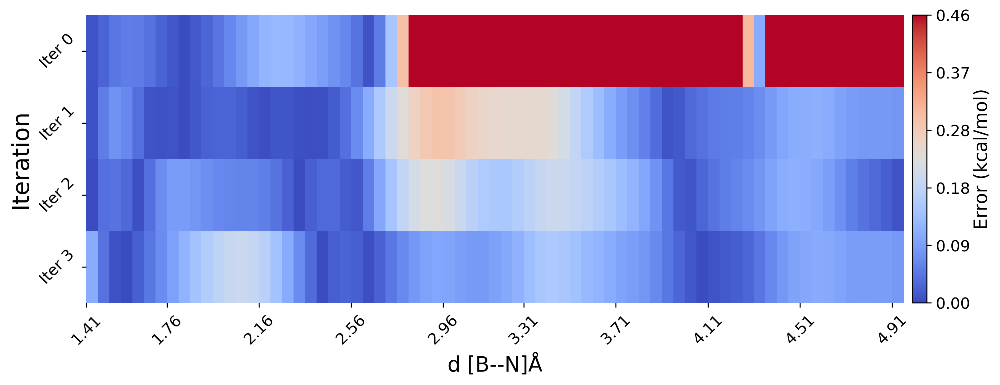

In [69]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter, LinearLocator

# DFT energies
distances = np.array(data['Dist.'])
energy_dft = np.array(data['E(DFT)'])
ev_to_kcal = 627.51/27.2    # 23.07
#
error = []
i_start = 0
i_end = 4
for i in range(i_start, i_end): 
    energy_iter = np.array(data[f"E(iter_00000{i})"])
    err = np.abs(energy_iter - energy_dft)  # absolute error per frame
    error.append(err)

# Convert to kcal/mol for better visibility
error_kcal = np.array(error) * ev_to_kcal
vmin, vmax = 0.0, 0.02 * ev_to_kcal

fig, ax = plt.subplots(figsize=(12, 4), dpi=300)

# Error Heatmap
hm = sns.heatmap(error_kcal, cmap='coolwarm', vmin=vmin, vmax=vmax, cbar=False, ax=ax)

# Axes
plt.xlabel(r"d [B--N]$\rm{\AA}$", fontsize=16)
ax.set_ylabel("Iteration", fontsize=18)

# Format axes
xtick_locs = np.linspace(0, len(distances) - 1, num=10, dtype=int)
xtick_labels = [f"{distances[i]:.2f}" for i in xtick_locs]
ax.set_xticks(ticks=xtick_locs, labels=xtick_labels, rotation=45, fontsize=12)
ax.set_yticks(ticks=np.arange(i_end - i_start) + 0.5, labels=[f'Iter {i}' for i in range(i_start, i_end)], rotation=45, fontsize=12)

# Colorbar
cbar = fig.colorbar( hm.collections[0], ax=ax, pad=0.01, fraction=0.05)

cbar.set_label("Error (kcal/mol)", fontsize=14, labelpad=2)
cbar.ax.tick_params(labelsize=12)

#
cbar.locator = LinearLocator(numticks=6) 
cbar.update_ticks()
cbar.ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

plt.show()

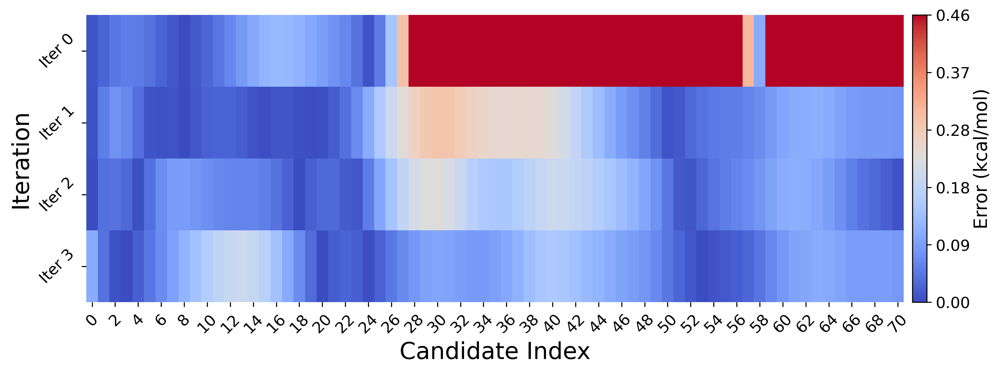

In [37]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter, LinearLocator

# DFT energies
energy_dft = np.array(data['E(DFT)'])
ev_to_kcal = 627.51/27.2    # 23.07
#
error = []
i_start = 0
i_end = 4
for i in range(i_start, i_end): 
    energy_iter = np.array(data[f"E(iter_00000{i})"])
    err = np.abs(energy_iter - energy_dft)  # absolute error per frame
    error.append(err)

# Convert to kcal/mol for better visibility
error_kcal = np.array(error) * ev_to_kcal
vmin, vmax = 0.0, 0.02 * ev_to_kcal

fig, ax = plt.subplots(figsize=(12, 4), dpi=300)

# Error Heatmap
hm = sns.heatmap(error_kcal, cmap='coolwarm', vmin=vmin, vmax=vmax, cbar=False, ax=ax)

# Axes
ax.set_xlabel("Candidate Index", fontsize=18)
ax.set_ylabel("Iteration", fontsize=18)

n_frames = error_kcal.shape[1]
xtick_idx = np.arange(0, n_frames, 2)
ax.set_xticks(xtick_idx + 0.5)
ax.set_xticklabels(xtick_idx, rotation=45, fontsize=12)

ax.set_yticks(np.arange(i_end - i_start) + 0.5)
ax.set_yticklabels([f'Iter {i}' for i in range(i_start, i_end)], rotation=45, fontsize=12)

# Colorbar
cbar = fig.colorbar( hm.collections[0], ax=ax, pad=0.01, fraction=0.05)

cbar.set_label("Error (kcal/mol)", fontsize=14, labelpad=2)
cbar.ax.tick_params(labelsize=12)

#
cbar.locator = LinearLocator(numticks=6) 
cbar.update_ticks()
cbar.ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

plt.show()

### [2] Free Energy Analysis

As we see from above plot, the energy prediction errors are very close to 0 eV, after the first iteration which indicates early convergence of our MLP. However, despite this accuracy in static energy evaluations, it is essential to evaluate the dynamical stability and transferability of the potential under real simulation conditions.

Therefore, we will run MD simulations using our latest ML model (`Iteration 4`). We will perform enhanced sampling MD (in this case: `Metadynamics`) to explore the free energy landscape and evaluate whether the model accurately reproduces rare-event dynamics and reaction pathways.

The results from ML/MD simulation will be quantitatively compared to AIMD data (VASP) in terms of free energy profiles along relevant collective variables. This comparison will help assess whether the ML potential is not only locally accurate but also `globally reliable for sampling the relevant phase space`.

In [124]:
# AIMD Free Energy Data
fes_aimd = pd.read_csv('iter_000004/02.dpmd/MetaD/HILLSPOT.xyz', delimiter='\s+', names=['d', 'f'])
fes_aimd.head()

,d,f
0,1.2000,-0.000358
1,1.2076,-0.000601
2,1.2152,-0.000987
3,1.2228,-0.001590
4,1.2304,-0.002509


In [125]:
# ML/MD Free Energy Data
fes_mlmd = pd.read_csv('iter_000004/02.dpmd/MetaD/fes.dat', comment='#' ,delimiter='\s+', names=['d', 'f', 'der.f'])
fes_mlmd.head()

,d,f,der.f
0,1.169460,1.258959,-0.000000
1,1.187133,1.258879,-0.010445
2,1.204805,1.258444,-0.043594
3,1.222478,1.256988,-0.134851
4,1.240151,1.253115,-0.326709


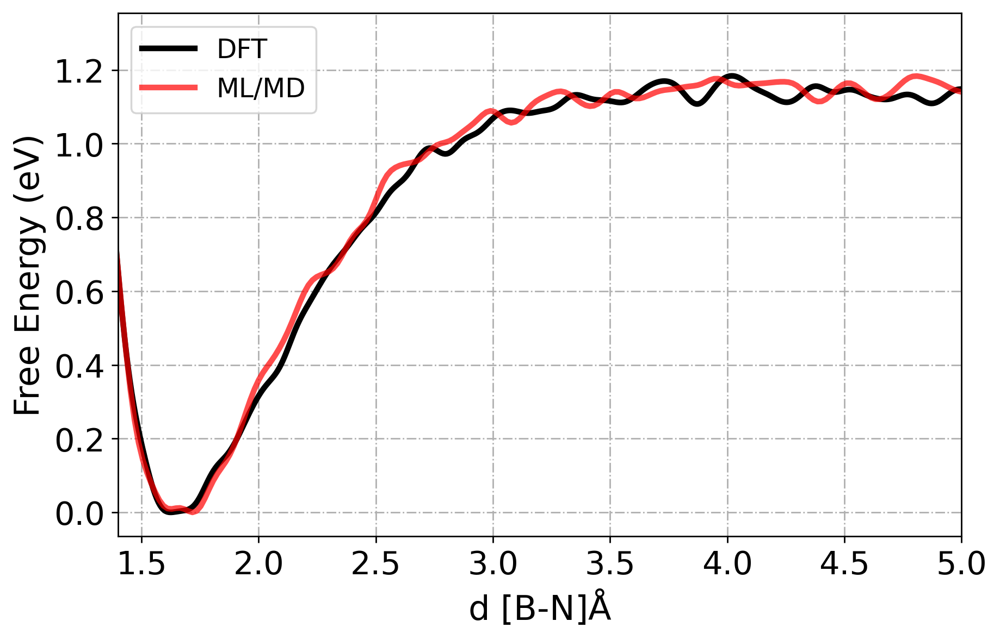

In [132]:
import matplotlib as mpl

mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['Helvetica', 'DejaVu Sans']

fig, ax1 = plt.subplots(figsize=(8, 5), dpi=250)

ax1.plot(fes_aimd['d'], (np.array(fes_aimd['f']) - min(fes_aimd['f'])), label='DFT', lw=3, c='black')
ax1.plot(fes_mlmd['d'], (np.array(fes_mlmd['f']) - min(fes_mlmd['f'])), label='ML/MD', lw=3, c='r', alpha=0.7)

ax1.set_xlabel(r"d [B-N]$\rm{\AA}$", fontsize=18, color='black')
ax1.set_ylabel("Free Energy (eV)", fontsize=18, color='black')
ax1.tick_params(axis='y', labelcolor='black')

#
ax1.legend(loc="upper left", fontsize=14)
ax1.tick_params(axis='both', labelsize=17)
# 
plt.xlim(1.4, 5)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.grid(ls='-.')

# 
plt.show()

#### [21] RMSE in free energy profiles

In [14]:
from scipy.interpolate import make_interp_spline
def align_fes(dft_pos, dft_pmf, ml_pos, ml_pmf, pos_x=1.6, n_points=300):

    # Define shared interpolation domain
    min_pos, max_pos = 1.4, 5.0
    d_pos = np.linspace(min_pos, max_pos, n_points)

    # Filter original data within [min_pos, max_pos]
    dft_mask = (dft_pos >= min_pos) & (dft_pos <= max_pos)
    ml_mask = (ml_pos >= min_pos) & (ml_pos <= max_pos)

    dft_fes_pos = dft_pos[dft_mask]
    dft_fes_pmf = dft_pmf[dft_mask]
    ml_fes_pos = ml_pos[ml_mask]
    ml_fes_pmf = ml_pmf[ml_mask]

    # Interpolate to common grid using cubic splines
    dft_interp = make_interp_spline(dft_fes_pos, dft_fes_pmf, k=3)
    ml_interp = make_interp_spline(ml_fes_pos, ml_fes_pmf, k=3)

    dft_fes_pmf_interp = dft_interp(d_pos)
    ml_fes_pmf_interp = ml_interp(d_pos)

    # Align ML FES to DFT FES at specified position
    dft_pmf_at_pos = np.interp(pos_x, d_pos, dft_fes_pmf_interp)
    ml_pmf_at_pos = np.interp(pos_x, d_pos, ml_fes_pmf_interp)
    alignment_shift = dft_pmf_at_pos - ml_pmf_at_pos
    ml_fes_pmf_interp += alignment_shift

    return d_pos, dft_fes_pmf_interp, d_pos, ml_fes_pmf_interp

In [13]:
# Find minimum in free energy and its location
dloc = np.argmin(fes_aimd['f'])
# Get corresponding distance at `dloc`
pos_x = fes_aimd['d'][dloc]
print(pos_x)

1.6256


In [22]:
# Align curves along the minimum in the X-axis
dft_pos, dft_pmf, dpmd_pos, dpmd_pmf = align_fes(fes_aimd['d'], fes_aimd['f'], fes_mlmd['d'], fes_mlmd['f'], pos_x=pos_x)

In [19]:
def plt_fes(dft_pos, dft_pmf, ml_pos, ml_pmf, c1='red', c2='blue', model_1='DFT', ml_model='ML/MD'):

    fig, ax1 = plt.subplots(figsize=(8, 5), dpi=250)

    ax1.plot(dft_pos, dft_pmf - min(dft_pmf), lw=3, c=f'{c1}', label=f'{model_1}', alpha=0.9, 
             marker='o', ms=7, markevery=15, markerfacecolor='none', markeredgewidth=1.5)
    ax1.plot(ml_pos, ml_pmf - min(dft_pmf), lw=3, c=f'{c2}', label=f'{ml_model}', alpha=0.9,
             marker='o', ms=7, markevery=15, markerfacecolor='none', markeredgewidth=1.5)
    
    ax1.set_xlabel(r"d [B--N]$\rm{\AA}$", fontsize=18, color='black')
    ax1.set_ylabel("Free Energy (eV)", fontsize=18, color='black')
    ax1.tick_params(axis='y', labelcolor='black')

    #
    ax1.legend(loc="upper left", fontsize=14)
    ax1.tick_params(axis='both', labelsize=17)
    
    plt.xlim(1.4, 5)
    plt.xticks(fontsize=17)
    plt.yticks(fontsize=17)
    plt.grid(ls='-.')
    
    plt.show()

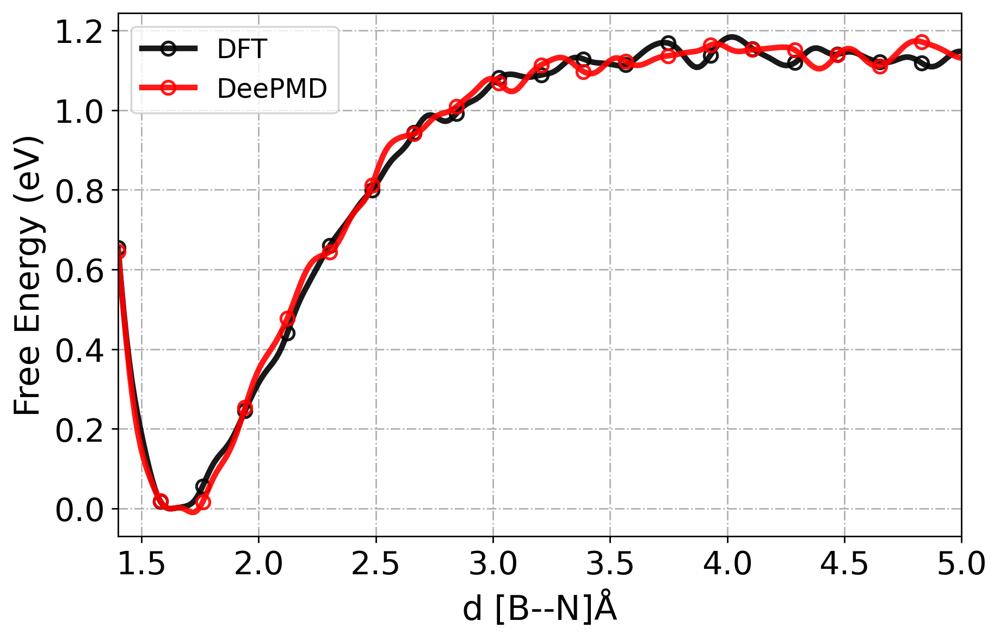

In [20]:
plt_fes(dft_pos, dft_pmf, dpmd_pos, dpmd_pmf, c1='black', c2='red', model_1='DFT', ml_model='DeePMD')

In [52]:
from scipy.interpolate import interp1d
# Min and Max position at which PMF is considerd
min_pos, max_pos = 1.4, 5.0

# Scipy interpolation
X_pos = np.linspace(min_pos, max_pos, num=500)  # num --> number of interpolation points
dft_fes_pmf_interp = interp1d(dft_pos, dft_pmf, kind='linear', fill_value='extrapolate')(X_pos)
dpmd_fes_pmf_interp = interp1d(dpmd_pos, dpmd_pmf, kind='linear', fill_value='extrapolate')(X_pos)

# Calculate Root Mean Square Deviation (RMSD) with respect to the minimum PMF at postion x_pos
rmsd = np.sqrt(np.mean((dft_fes_pmf_interp - dpmd_fes_pmf_interp) ** 2))
print(f"Error between free energies: {rmsd:.6f} eV ({rmsd*ev_to_kcal:.2f} kcal/mol)")

# Save interpolated FES and positions to a file using numpy.vstack -> Stack arrays
output_data = np.vstack((X_pos, dft_fes_pmf_interp, dpmd_fes_pmf_interp)).T

# np.savetxt('interpolated_fes.dat', output_data, header='#Position, DFT_FES_PMF, DPMD_FES_PMF', comments='')
# for i in range(len(common_positions)):
#     print(common_positions[i], dft_fes_pmf_interpolated[i], dpmd_fes_pmf_interpolated[i])

# print("Interpolated FES and positions saved to 'interpolated_fes.dat'.")


Error between free energies: 0.026649 eV (0.61 kcal/mol)
